In [1]:
%matplotlib inline

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import anndata2ri
anndata2ri.activate()
%load_ext rpy2.ipython

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/rpy2/robjects/pandas2ri.py:14: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import Index as PandasIndex


# Import scripts

In [4]:
path_scripts = '/Users/simjoo/Projects/10X_PDAC_Lgr5/scripts/v3/'

In [5]:
import sys
sys.path.append(path_scripts)

In [6]:
from ipyparallel import Client
import csv
import os
import pickle
import scipy.io
import scanpy as sc
import anndata
import bbknn
import statsmodels.api as sm
import gseapy as gp
import phenograph as pg
import ternary

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/numba/core/cpu.py:77: UserWarning: Numba extension module 'sparse._numba_extension' failed to load due to 'ModuleNotFoundError(No module named 'numba.targets')'.
  numba.core.entrypoints.init_all()


In [7]:
%R library(Seurat)
%R library(SingleCellExperiment)
%R library(scran)
%R library(DropletUtils)
%R library(DESeq2)

R[write to console]: Loading required package: SummarizedExperiment

R[write to console]: Loading required package: GenomicRanges

R[write to console]: Loading required package: stats4

R[write to console]: Loading required package: BiocGenerics

R[write to console]: Loading required package: parallel

R[write to console]: 
Attaching package: ‘BiocGenerics’


R[write to console]: The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


R[write to console]: The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


R[write to console]: The following objects are masked from ‘package:base’:

    Filter, Find, Map, Position, Reduce, anyDuplicated, append,
    as.data.frame, basename, cbind, colnames, dirname, do.call,
    duplicated, eval, evalq, get, grep, grepl, intersect, is.unsorted

array(['DESeq2', 'DropletUtils', 'scran', 'SingleCellExperiment',
       'SummarizedExperiment', 'DelayedArray', 'BiocParallel',
       'matrixStats', 'Biobase', 'GenomicRanges', 'GenomeInfoDb',
       'IRanges', 'S4Vectors', 'BiocGenerics', 'parallel', 'stats4',
       'Seurat', 'tools', 'stats', 'graphics', 'grDevices', 'utils',
       'datasets', 'methods', 'base'], dtype='<U20')

In [8]:
from TenX_PDAC_misc_scripts_v1_0 import *
from TenX_PDAC_plot_v1_0 import *
from TenX_PDAC_mann_whitney_u_v1_0 import *

In [9]:
#exp_id = create_ID()

In [10]:
exp_id = '202110251102'
path_input = '/Users/simjoo/Projects/10X_PDAC_Lgr5/data_input/'
path_output = '/Users/simjoo/Projects/10X_PDAC_Lgr5/data_output/v3/'
path_figures = '/Users/simjoo/Projects/10X_PDAC_Lgr5/figures/v3/'

In [11]:
cmap_tab20 = {str(c) : mpl.colors.rgb2hex(plt.cm.tab20(c/20)) for c in range(20)}
cmap_tumor = {'autochthonous':'#d95f02', 'fragment_transplant':'#1b9e77', 'sorted_transplant':'#7570b3',
              '2D':'#e7298a','3D_2%':'#66a61e','3D_Tuv':'#e6ab02',}
cmap_treatment = {'3d_TAM':'#addd8e','10d_Veh':'#31a354','20d_TAM':'#006837',
                  '10d_LGK':'#fd8d3c','20d_LGK':'#bd0026','10d_Gem':'#2c7fb8'}
cmap_lineage_tracing = {'tdTomato': '#d95f02', 'Negative': 'silver', 'tdTomato-GFP': '#e6ab02', 'GFP': '#66a61e'}
cmap_cl_tumor = {'Luminal cells':'#7570b3',
               'Basal cells':'#1b9e77',
               'Mesenchymal cells':'#d95f02',
                 'Other':'silver'}

# Initialize engines

In [12]:
c = Client()

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/ipyparallel/util.py:214: RuntimeWarning: IPython could not determine IPs for bionut2400: [Errno 8] nodename nor servname provided, or not known
  RuntimeWarning)
/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/ipyparallel/client/client.py:466: RuntimeWarning: 
            Controller appears to be listening on localhost, but not on this machine.
            If this is true, you should specify Client(...,sshserver='you@bionut2400')
            or instruct your controller to listen on an external IP.
  RuntimeWarning)


In [13]:
dview = c[:]

In [14]:
dview.execute('import sys')
dview.execute('sys.path.append("/Users/simjoo/Projects/10X_PDAC_Lgr5/scripts/v3/")')
dview.execute('from TenX_PDAC_misc_scripts_v1_0 import *')
dview.execute('from TenX_PDAC_plot_v1_0 import *')
dview.execute('from TenX_PDAC_mann_whitney_u_v1_0 import *')

<AsyncResult: execute>

# Clustering of all tumor cells

In [17]:
X = sc.read_h5ad('%s/%s_X_PDAC_Lgr5_pp.h5' % (path_output, exp_id))

In [18]:
X.obs['cl_all_nmf'] = sc.read_h5ad('%s/%s_Xs_PDAC_Lgr5_all.h5' % (path_output, exp_id)).obs['cl_all_nmf']

In [19]:
X.X = X.layers['norm_log2']

## Select tumor cells

In [20]:
c_sel = X.obs['cl_all_nmf'][X.obs['cl_all_nmf']=='Epithelial cells'].index

In [21]:
len(c_sel)

104588

In [22]:
X = X[c_sel]

## Feature selection - gene filtering

In [23]:
g_sel = X.var[(X.var['mean_counts']>0.1) & (X.var['n_cells_by_counts']>(len(X.obs_names)*0.1))].index

In [24]:
len(g_sel)

7990

In [25]:
Xs = X[:,g_sel]

In [26]:
X = None

## Feature selection - VST

In [27]:
pdX = sc2pd(Xs, 'raw')

In [28]:
feat = select_features_vst(pdX, 2500)

In [29]:
Xs = Xs[:,feat]

## Dimensionality reduction

In [30]:
pdX = sc2pd(Xs, 'norm_log2')

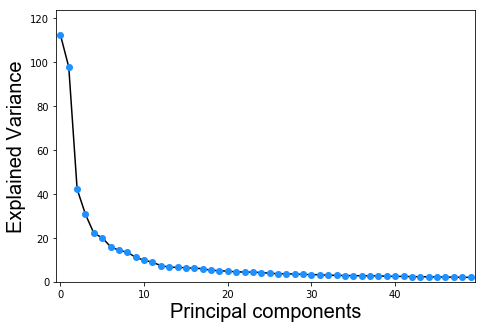

In [31]:
draw_pca_explained_var(pdX)

In [32]:
pca = dim_reduc(pdX, dim=20, method='PCA')

In [33]:
nmf = dim_reduc(pdX, dim=50, method='NMF')

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/sklearn/decomposition/_nmf.py:1077: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


In [34]:
Xs.obsm['X_pca'] = np.array(pca).T
Xs.obsm['X_nmf'] = np.array(nmf).T

In [35]:
pdX = None

## UMAP - PCA, no batch regression

In [36]:
sc.pp.neighbors(Xs, n_neighbors=25, use_rep='X_pca', metric='euclidean')

In [37]:
sc.tl.umap(Xs, min_dist=1, spread=3)

In [38]:
Xs.obsm['X_umap_pca_noreg'] = Xs.obsm['X_umap']

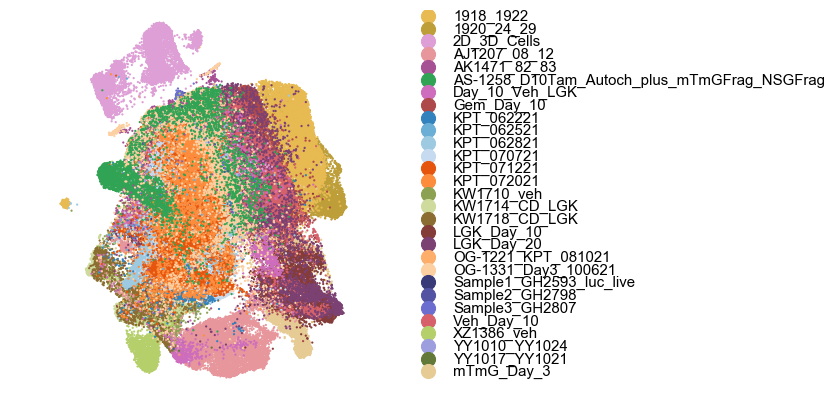

In [39]:
draw_scatter_groups(Xs.obsm['X_umap_pca_noreg'], 
                    Xs.obs['batch'],
                    {g:plt.cm.tab20b(i/20) if i<20 else plt.cm.tab20c((i-20)/20) for i, g in enumerate(return_unique(Xs.obs['batch']))},
                    s=5, show_axes = False)

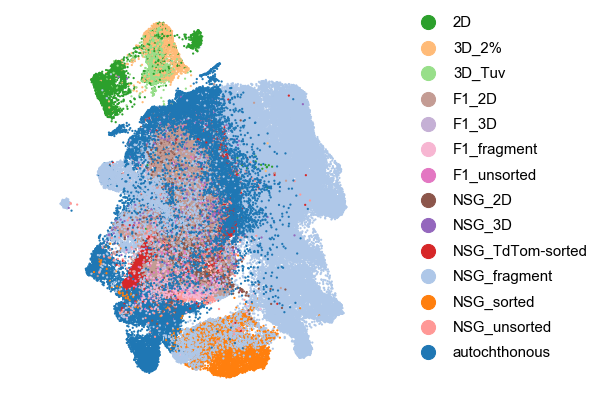

In [40]:
draw_scatter_groups(Xs.obsm['X_umap_pca_noreg'], 
                    Xs.obs['tumor'],
                    s=5, show_axes = False)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

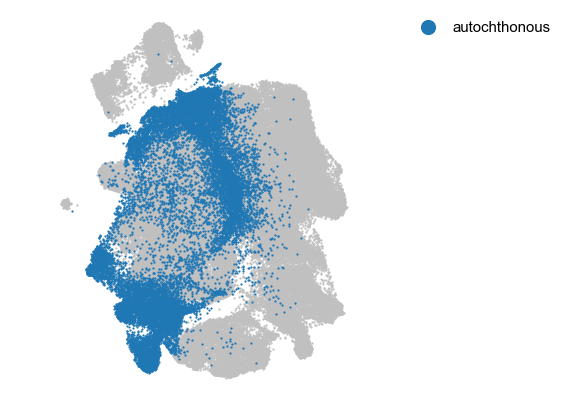

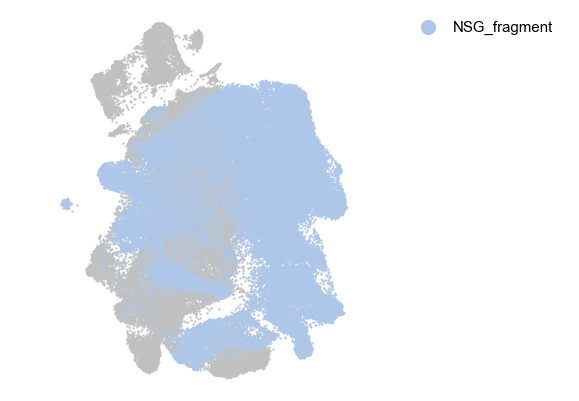

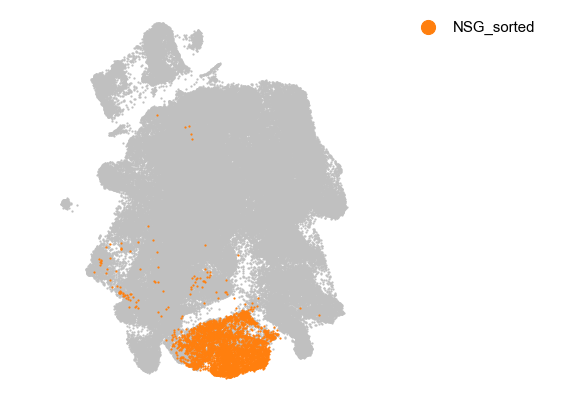

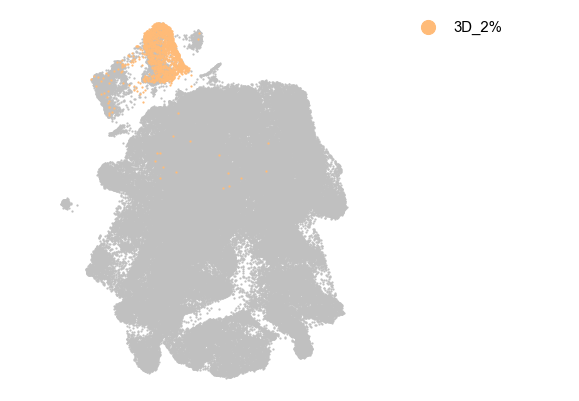

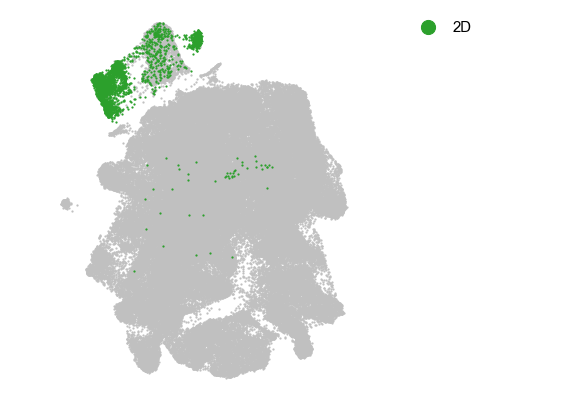

...

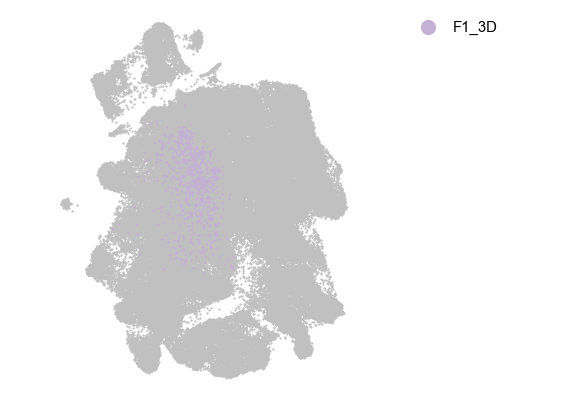

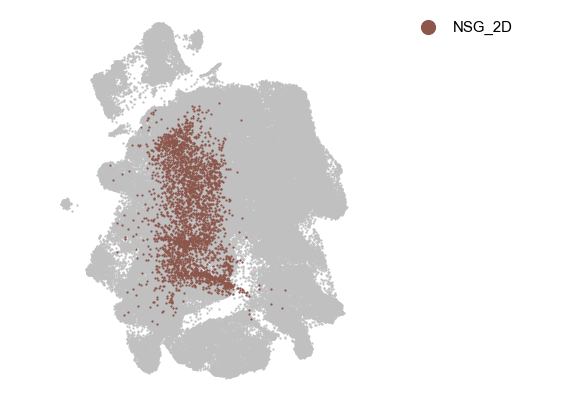

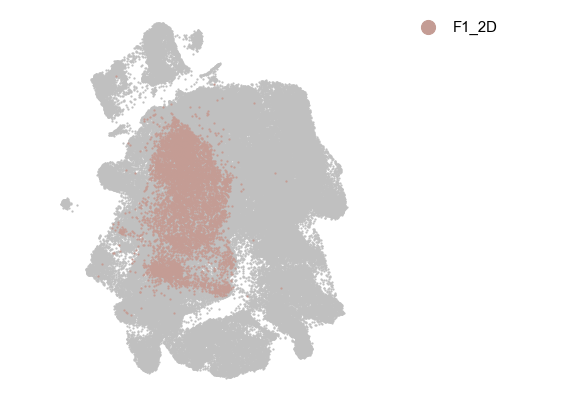

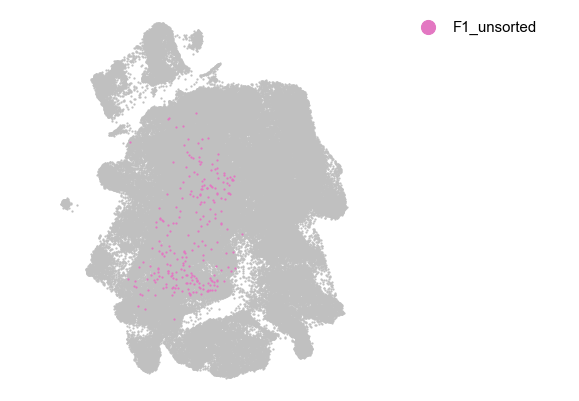

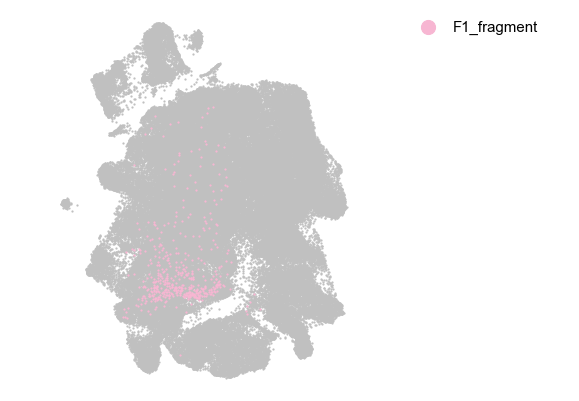

In [41]:
draw_scatter_groups_individual(Xs.obsm['X_umap_pca_noreg'], 
                               Xs.obs['tumor'],
                               s=5, show_axes = False)

## UMAP - PCA, bbknn

In [48]:
bbknn.bbknn(Xs, batch_key='mouse', use_rep = 'X_pca', neighbors_within_batch=5, metric='euclidean')

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/bbknn/__init__.py:294: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['distances'] = bbknn_out[0]
/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/bbknn/__init__.py:295: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'] = bbknn_out[1]


In [49]:
sc.tl.umap(Xs, min_dist=1, spread=3)

In [50]:
Xs.obsm['X_umap_pca_bbknn'] = Xs.obsm['X_umap']

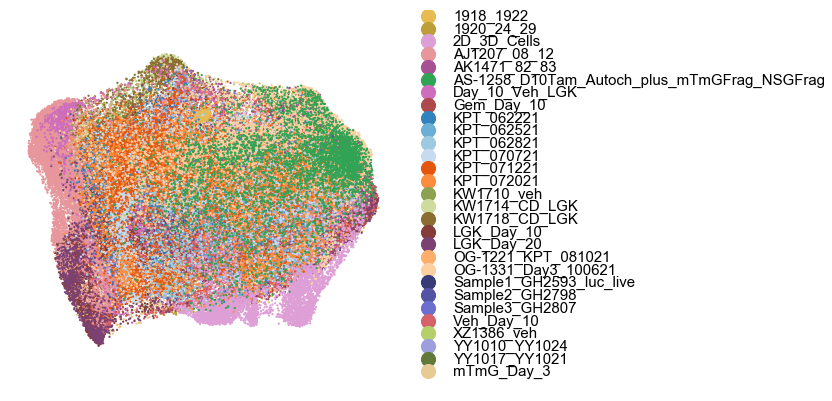

In [51]:
draw_scatter_groups(Xs.obsm['X_umap_pca_bbknn'], 
                    Xs.obs['batch'], 
                    {g:plt.cm.tab20b(i/20) if i<20 else plt.cm.tab20c((i-20)/20) for i, g in enumerate(return_unique(Xs.obs['batch']))},
                    s=5, show_axes = False)

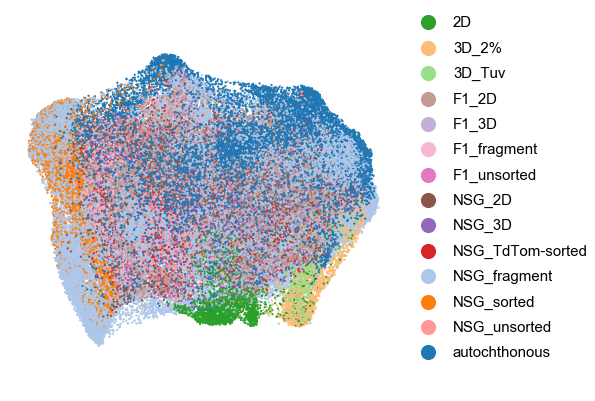

In [52]:
draw_scatter_groups(Xs.obsm['X_umap_pca_bbknn'], 
                    Xs.obs['tumor'],
                    s=5, show_axes = False)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

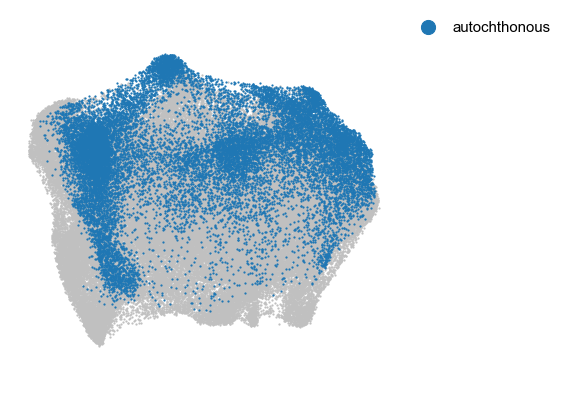

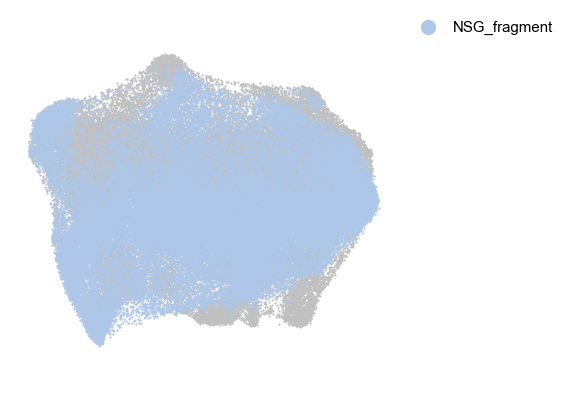

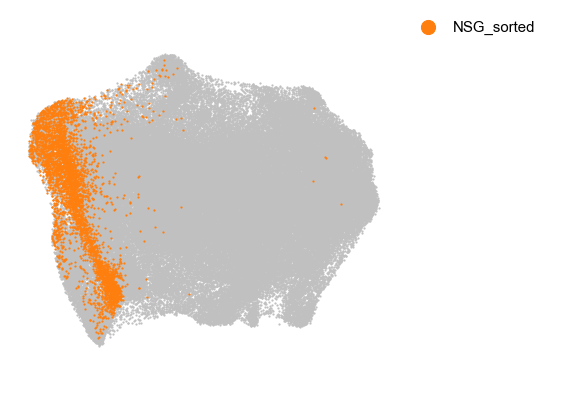

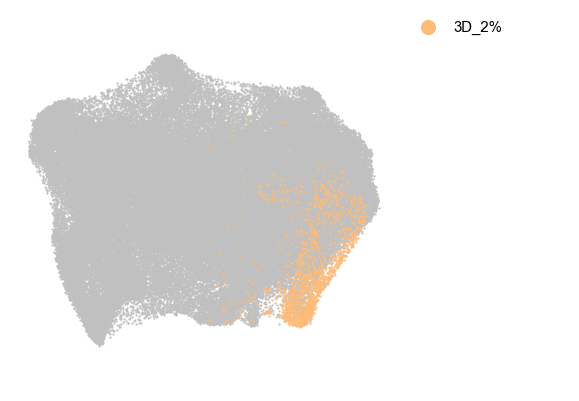

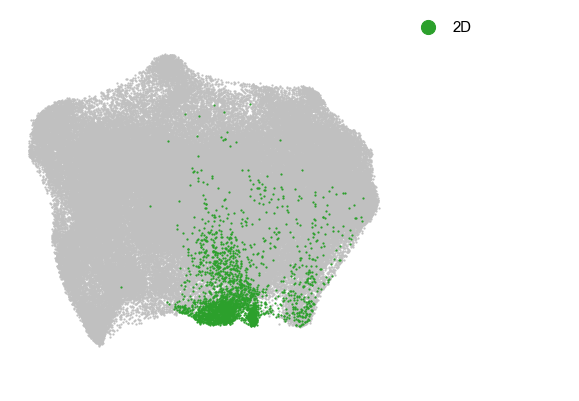

...

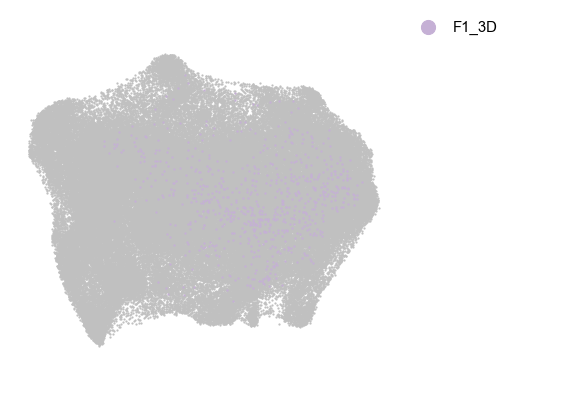

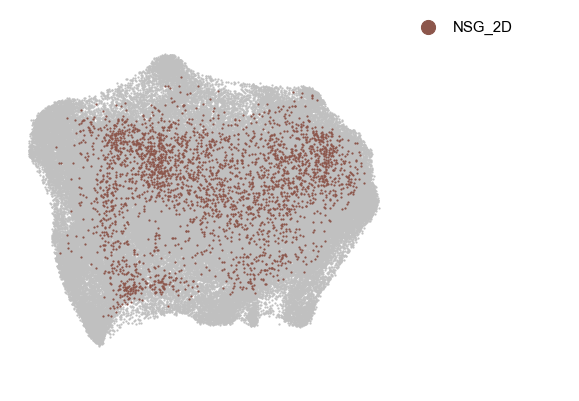

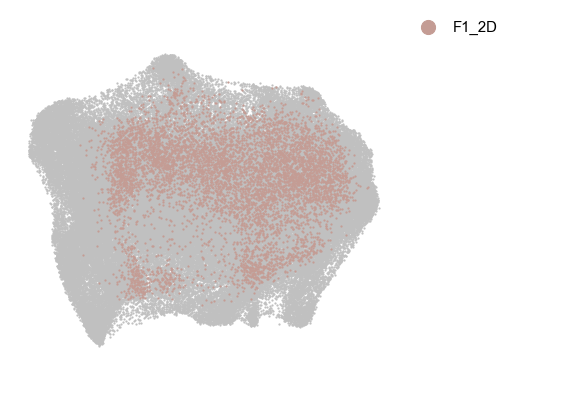

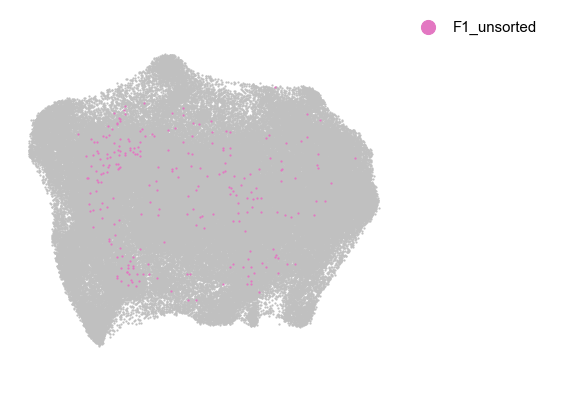

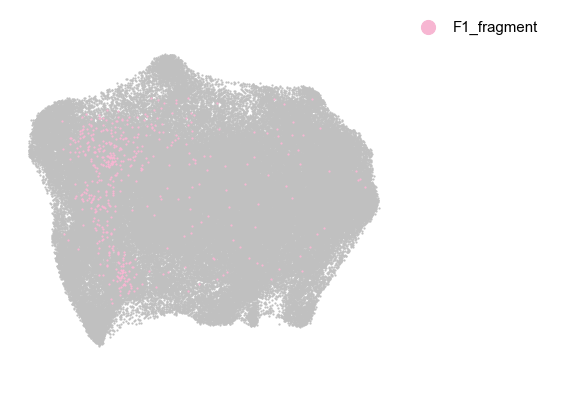

In [53]:
draw_scatter_groups_individual(Xs.obsm['X_umap_pca_bbknn'], 
                               Xs.obs['tumor'],
                               s=5, show_axes = False)

## Checkpoint

In [60]:
Xs.write_h5ad('%s/%s_Xs_PDAC_Lgr5_tumor.h5' % (path_output, exp_id))

# Clustering of autochthonous tumors and projection of all tumor cells into same dimensionality reduced space

In [15]:
X = sc.read_h5ad('%s/%s_X_PDAC_Lgr5_pp.h5' % (path_output, exp_id))

In [16]:
X.obs['cl_all_nmf'] = sc.read_h5ad('%s/%s_Xs_PDAC_Lgr5_all.h5' % (path_output, exp_id)).obs['cl_all_nmf'] #using NMF representation to select tumor cells

In [17]:
X.X = X.layers['norm_log2']

## Cell cycle prediction

In [18]:
genes_s = open('%s/s-genes.txt' % path_input).read().split()
genes_g2m = open('%s/g2m-genes.txt' % path_input).read().split()

In [19]:
sc.tl.score_genes_cell_cycle(X, s_genes=genes_s, g2m_genes=genes_g2m)

## Select tumor cells

In [20]:
c_sel = X.obs['cl_all_nmf'][X.obs['cl_all_nmf']=='Epithelial cells'].index

In [21]:
len(c_sel)

104588

In [22]:
X = X[c_sel]

## Select autochthonous cells

In [23]:
c_sel = X.obs['tumor'][X.obs['tumor']=='autochthonous'].index

In [24]:
len(c_sel)

18413

In [25]:
X_ = X[c_sel]

## Feature selection - gene filtering

In [26]:
g_sel = X_.var[(X_.var['mean_counts']>0.1) & (X_.var['n_cells_by_counts']>(len(X_.obs_names)*0.1))].index

In [27]:
len(g_sel)

8042

In [28]:
Xs = X[:,g_sel]
Xs_ = X_[:,g_sel]

## Feature selection - VST

In [64]:
pdX = sc2pd(Xs_, 'raw')

In [65]:
feat = select_features_vst(pdX, 1000)

In [66]:
Xs = Xs[:,feat]
Xs_ = Xs_[:,feat]

## Regression of cell cycle

In [67]:
sc.pp.regress_out(Xs, ['S_score', 'G2M_score'])
sc.pp.regress_out(Xs_, ['S_score', 'G2M_score'])

## Dimensionality reduction - PCA

In [68]:
pdX = sc2pd(Xs, 'X', sparse=False)
pdX_ = sc2pd(Xs_, 'X', sparse=False)

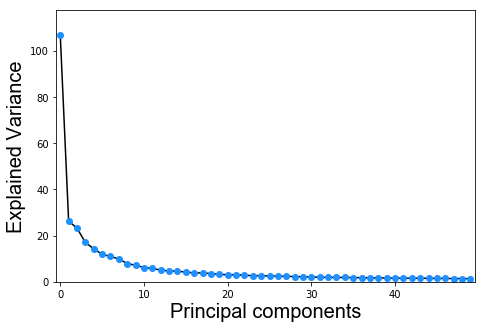

In [69]:
draw_pca_explained_var(pdX_)

In [70]:
dim = 50
pca = PCA(n_components=dim)
pca.fit(pdX_.T)
pcs_ = pd.DataFrame(pca.transform(pdX_.T), columns = range(dim), index = pdX_.columns)
pcs = pd.DataFrame(pca.transform(pdX.T), columns = range(dim), index = pdX.columns)

In [71]:
Xs.obsm['X_pca'] = np.array(pcs)
Xs_.obsm['X_pca'] = np.array(pcs_)

## UMAP - PCA, bbknn

In [72]:
bbknn.bbknn(Xs, batch_key='batch',  use_rep='X_pca', neighbors_within_batch=2, metric='euclidean')
bbknn.bbknn(Xs_, batch_key='batch', use_rep='X_pca', neighbors_within_batch=2, metric='euclidean')

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/bbknn/__init__.py:294: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['distances'] = bbknn_out[0]
/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/bbknn/__init__.py:295: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'] = bbknn_out[1]


In [73]:
sc.tl.umap(Xs, min_dist=1, spread=3)
sc.tl.umap(Xs_, min_dist=1, spread=3)

In [74]:
Xs_.obsm['X_umap_pca'] = Xs_.obsm['X_umap']
Xs.obsm['X_umap_pca'] = Xs.obsm['X_umap']

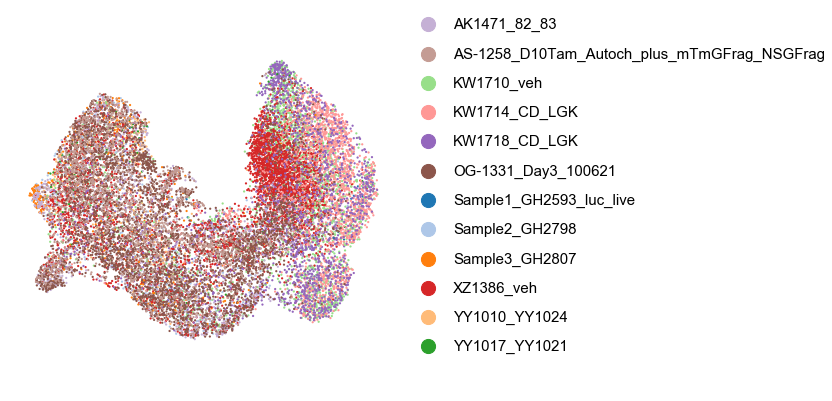

In [75]:
draw_scatter_groups(Xs_.obsm['X_umap_pca'], 
                    Xs_.obs['batch'], 
                    s=5, show_axes = False)

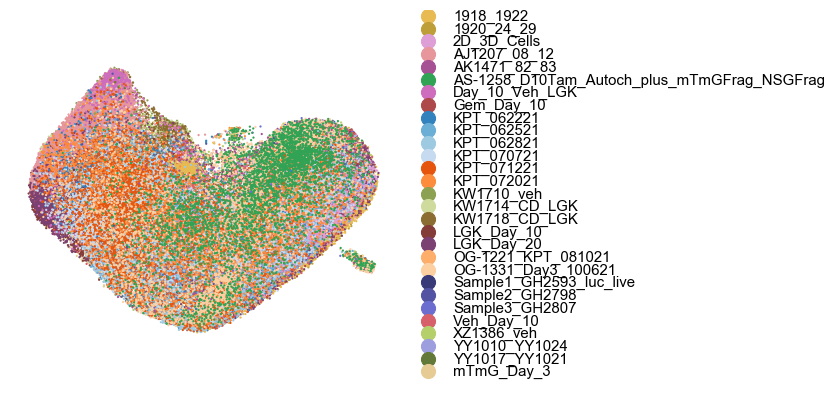

In [76]:
draw_scatter_groups(Xs.obsm['X_umap_pca'], 
                    Xs.obs['batch'],
                    {g:plt.cm.tab20b(i/20) if i<20 else plt.cm.tab20c((i-20)/20) for i, g in enumerate(return_unique(Xs.obs['batch']))},
                    s=5, show_axes = False)

## Marker genes - PCA projection

In [77]:
pdX = sc2pd(X, 'norm_log2')

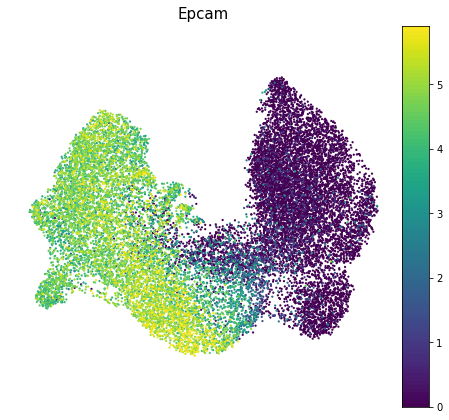

In [78]:
g = 'Epcam'
expr = pdX.loc[g, Xs_.obs_names]
draw_scatter_expr(Xs_.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = g,
                  s = 5, show_axes=False)

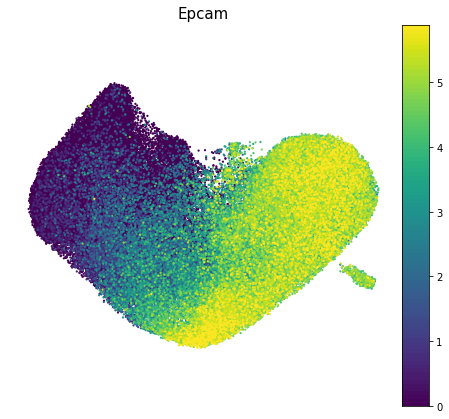

In [79]:
g = 'Epcam'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs[pdX.columns].obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = g,
                  s = 5, show_axes=False)

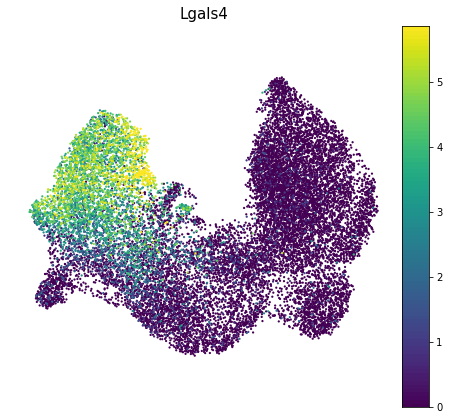

In [80]:
g = 'Lgals4'
expr = pdX.loc[g, Xs_.obs_names]
draw_scatter_expr(Xs_.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = g,
                  s = 5, show_axes=False)

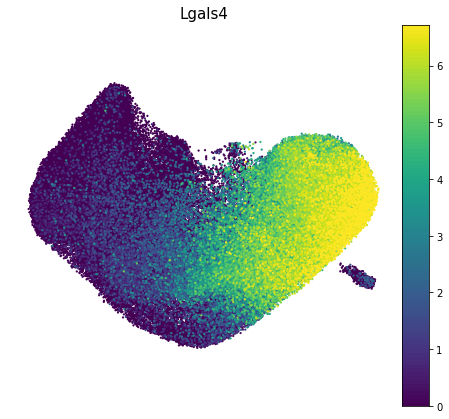

In [81]:
g = 'Lgals4'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs[pdX.columns].obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = g,
                  s = 5, show_axes=False)

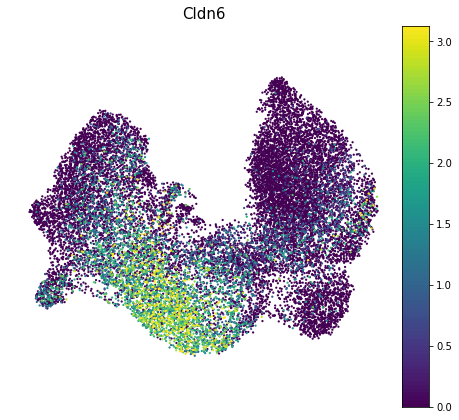

In [82]:
g = 'Cldn6'
expr = pdX.loc[g, Xs_.obs_names]
draw_scatter_expr(Xs_.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = g,
                  s = 5, show_axes=False)

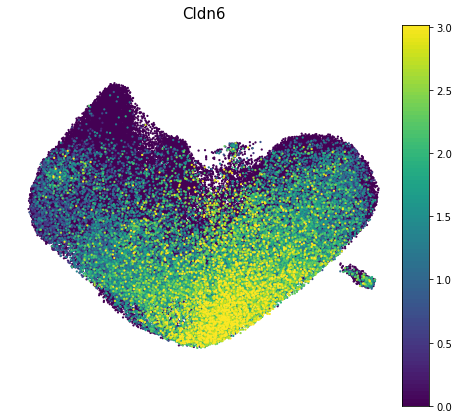

In [83]:
g = 'Cldn6'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs[pdX.columns].obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = g,
                  s = 5, show_axes=False)

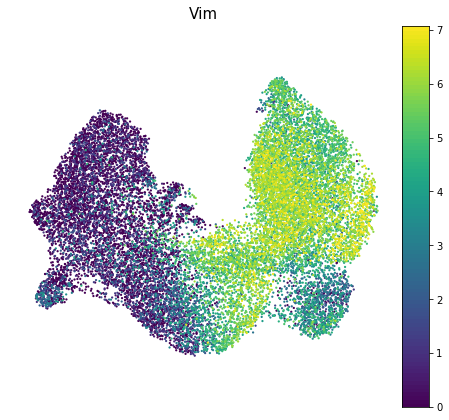

In [84]:
g = 'Vim'
expr = pdX.loc[g, Xs_.obs_names]
draw_scatter_expr(Xs_.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = g,
                  s = 5, show_axes=False)

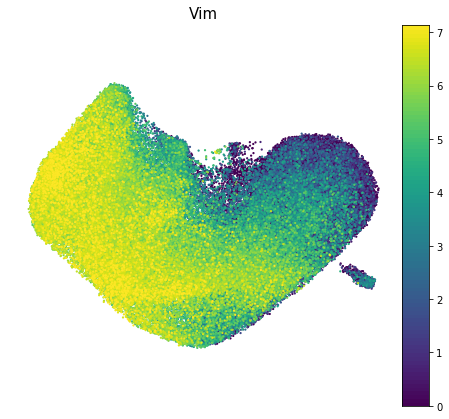

In [85]:
g = 'Vim'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs[pdX.columns].obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = g,
                  s = 5, show_axes=False)

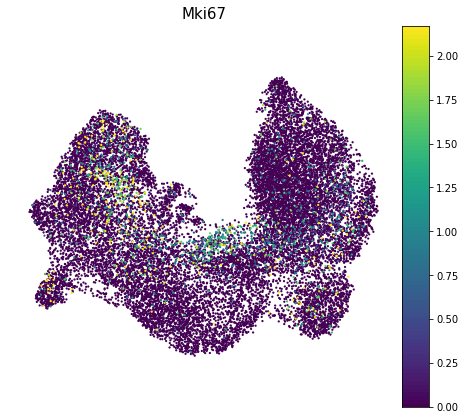

In [86]:
g = 'Mki67'
expr = pdX.loc[g, Xs_.obs_names]
draw_scatter_expr(Xs_.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = g,
                  s = 5, show_axes=False)

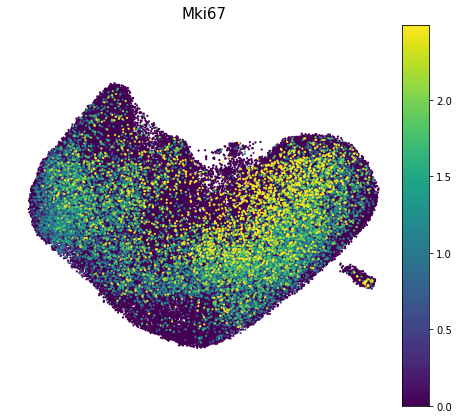

In [93]:
g = 'Mki67'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs[pdX.columns].obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = g,
                  s = 5, show_axes=False)

## Leiden clustering - PCA, bbknn

In [130]:
#sc.tl.leiden(Xs_, resolution = 0.3)
sc.tl.leiden(Xs, resolution = 0.3)

In [131]:
print(len(set(Xs_.obs['leiden'])), len(set(Xs.obs['leiden'])))

5 4


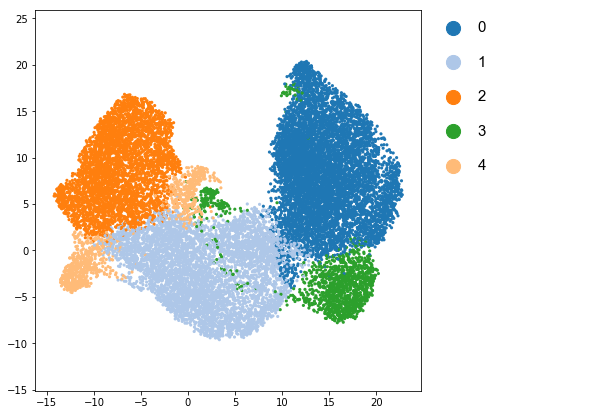

In [132]:
draw_scatter_groups(Xs_.obsm['X_umap_pca'], 
                    Xs_.obs['leiden'], 
                    s=10, show_axes=True)

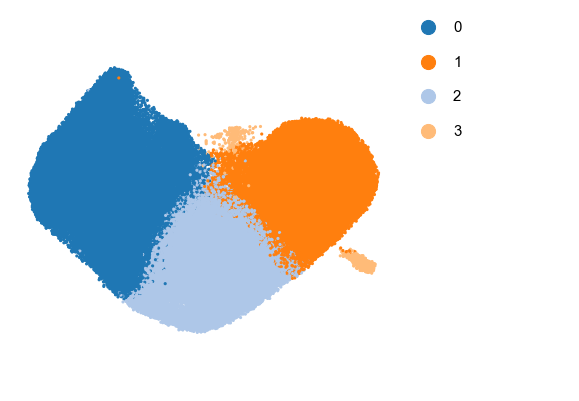

In [133]:
draw_scatter_groups(Xs.obsm['X_umap_pca'], 
                    Xs.obs['leiden'], 
                    s=10, show_axes=False)

In [134]:
cl_tumor_pca = pd.Series('Other', index = Xs_.obs_names)

# luminal 
for c in Xs_.obs['leiden'][Xs_.obs['leiden'].isin(['2'])].index: cl_tumor_pca[c] = 'Luminal cells'
    
# basal 
for c in Xs_.obs['leiden'][Xs_.obs['leiden'].isin(['1'])].index: cl_tumor_pca[c] = 'Basal cells'
    
# mesenchymal
for c in Xs_.obs['leiden'][Xs_.obs['leiden'].isin(['0'])].index: cl_tumor_pca[c] = 'Mesenchymal cells'
    
for c in Xs_.obs['leiden'][Xs_.obs['leiden'].isin(['3'])].index:
    if Xs_[c].obsm['X_umap_pca'][0][0]>7.5:
        cl_tumor_pca[c] = 'Mesenchymal cells'

In [135]:
Counter(cl_tumor_pca)

Counter({'Mesenchymal cells': 8396,
         'Basal cells': 4969,
         'Luminal cells': 3894,
         'Other': 1154})

In [136]:
Xs_.obs['cl_tumor_pca'] = cl_tumor_pca

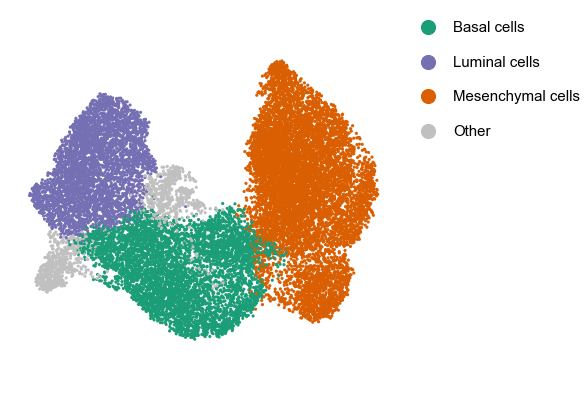

In [137]:
draw_scatter_groups(Xs_.obsm['X_umap_pca'], 
                    Xs_.obs['cl_tumor_pca'],
                    cmap_cl_tumor,
                    s=10, show_axes=False)

In [138]:
cl_tumor_pca = pd.Series('Other', index = Xs.obs_names)

# luminal 
for c in Xs.obs['leiden'][Xs.obs['leiden'].isin(['1'])].index: cl_tumor_pca[c] = 'Luminal cells'
    
# basal 
for c in Xs.obs['leiden'][Xs.obs['leiden'].isin(['2'])].index: cl_tumor_pca[c] = 'Basal cells'
    
# mesenchymal
for c in Xs.obs['leiden'][Xs.obs['leiden'].isin(['0'])].index:cl_tumor_pca[c] = 'Mesenchymal cells'

In [139]:
Counter(cl_tumor_pca)

Counter({'Mesenchymal cells': 49215,
         'Basal cells': 26803,
         'Luminal cells': 27652,
         'Other': 918})

In [140]:
Xs.obs['cl_tumor_pca'] = cl_tumor_pca

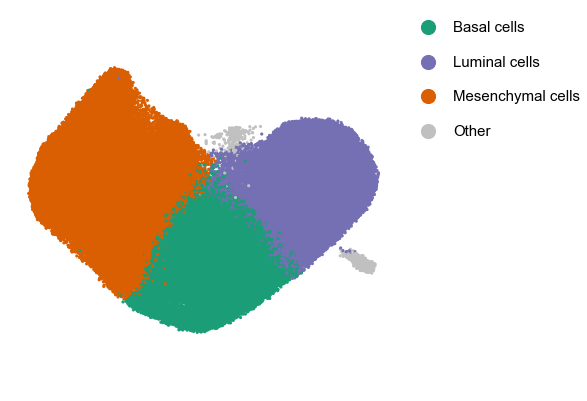

In [141]:
draw_scatter_groups(Xs.obsm['X_umap_pca'], 
                    Xs.obs['cl_tumor_pca'],
                    cmap_cl_tumor,
                    s=10, show_axes=False)

## Pseudotime - PCA, bbknn

In [149]:
c_sel = Xs.obs[Xs.obs['cl_tumor_pca']=='Luminal cells'].index
iroot = Xs[c_sel].obs_names[Xs[c_sel].obsm['X_umap_pca'][:,0]==np.max(Xs[c_sel].obsm['X_umap_pca'][:,0])][0]
Xs.uns['iroot'] = np.flatnonzero(Xs.obs_names == iroot)[0]

In [150]:
c_sel = Xs_.obs[Xs_.obs['cl_tumor_pca']=='Luminal cells'].index
iroot = Xs_[c_sel].obs_names[Xs_[c_sel].obsm['X_umap_pca'][:,1]==np.max(Xs_[c_sel].obsm['X_umap_pca'][:,1])][0]
Xs_.uns['iroot'] = np.flatnonzero(Xs_.obs_names == iroot)[0]

In [151]:
bbknn.bbknn(Xs, batch_key='batch',  use_rep='X_pca', neighbors_within_batch=2, metric='euclidean')
bbknn.bbknn(Xs_, batch_key='batch', use_rep='X_pca', neighbors_within_batch=2, metric='euclidean')

In [152]:
sc.tl.diffmap(Xs, n_comps=3)
sc.tl.diffmap(Xs_, n_comps=3)

In [153]:
sc.tl.dpt(Xs, n_branchings=0, n_dcs=3)
sc.tl.dpt(Xs_, n_branchings=0, n_dcs=3)

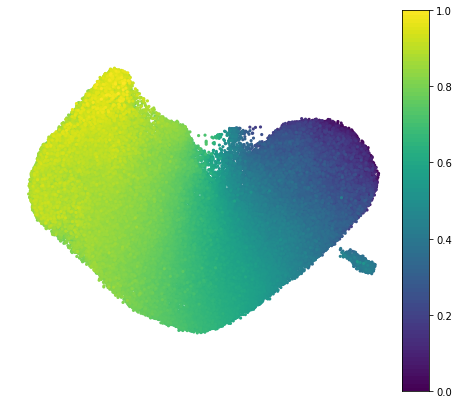

In [154]:
draw_scatter_expr(Xs.obsm['X_umap_pca'], 
                  Xs.obs['dpt_pseudotime'],
                  vmin=0,
                  vmax=1,
                  s=10, show_axes=False)

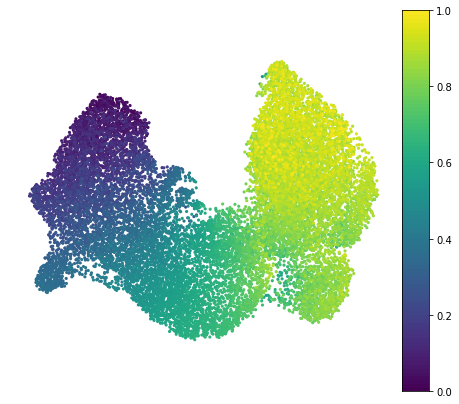

In [155]:
draw_scatter_expr(Xs_.obsm['X_umap_pca'], 
                  Xs_.obs['dpt_pseudotime'],
                  vmin=0,
                  vmax=1,
                  s=10, show_axes=False)

In [156]:
Xs.obsm['X_diffmap_pca'] = Xs.obsm['X_diffmap']
Xs_.obsm['X_diffmap_pca'] = Xs_.obsm['X_diffmap']

In [157]:
Xs.obs['dpt_pseudotime_pca'] = Xs.obs['dpt_pseudotime']
Xs_.obs['dpt_pseudotime_pca'] = Xs_.obs['dpt_pseudotime']

## Checkpoint

In [273]:
Xs.write_h5ad('%s/%s_Xs_PDAC_Lgr5_tumor_fit_on_aut.h5' % (path_output, exp_id))

... storing 'cl_tumor_pca' as categorical
... storing 'cl_tumor_nmf' as categorical


In [274]:
Xs_.write_h5ad('%s/%s_Xs_PDAC_Lgr5_tumor_aut.h5' % (path_output, exp_id))

... storing 'cl_tumor_pca' as categorical
... storing 'cl_tumor_nmf' as categorical


# Classification of orthtopic transplant cells based on Markov absorption of autochthonous cells (using phenograph in PCA space)

In [275]:
X = sc.read_h5ad('%s/%s_X_PDAC_Lgr5_pp.h5' % (path_output, exp_id))

In [276]:
Xs_aut = sc.read_h5ad('%s/%s_Xs_PDAC_Lgr5_tumor_aut.h5' % (path_output, exp_id))
Xs_fit_on_aut = sc.read_h5ad('%s/%s_Xs_PDAC_Lgr5_tumor_fit_on_aut.h5' % (path_output, exp_id))

In [277]:
Xs_test = X[Xs_fit_on_aut.obs_names]
Xs_test.obs['cl_tumor_pca'] = None
Xs_test.obs['cl_tumor_pca'][Xs_aut.obs_names] = Xs_aut.obs['cl_tumor_pca']
Xs_test.obs['cl_tumor_nmf'] = None
Xs_test.obs['cl_tumor_nmf'][Xs_aut.obs_names] = Xs_aut.obs['cl_tumor_nmf']

Trying to set attribute `.obs` of view, copying.
/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/simjoo/.local/lib/python3.6/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

Se

### Feature selection

In [278]:
g_sel = Xs_test.var[(Xs_test.var['mean_counts']>0.1) & (Xs_test.var['n_cells_by_counts']>(len(Xs_test.obs_names)*0.1))].index

In [279]:
len(g_sel)

7990

In [280]:
Xs_test = Xs_test[:,g_sel]

### Feature selection - VST

In [281]:
pdX = sc2pd(Xs_test, 'raw')

In [282]:
feat = select_features_vst(pdX, 2500)

In [283]:
Xs_test = Xs_test[:,feat]

### Regression of cell cycle

In [284]:
Xs_test.obs['S_score'], Xs_test.obs['G2M_score'] = None, None
Xs_test.obs['S_score'][Xs_fit_on_aut.obs_names] = Xs_fit_on_aut.obs['S_score']
Xs_test.obs['G2M_score'][Xs_fit_on_aut.obs_names] = Xs_fit_on_aut.obs['G2M_score']

Trying to set attribute `.obs` of view, copying.
/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/simjoo/.local/lib/python3.6/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

In [285]:
sc.pp.regress_out(Xs_test, ['S_score', 'G2M_score'])

... storing 'cl_tumor_pca' as categorical
... storing 'cl_tumor_nmf' as categorical


## PCA space

In [286]:
pdX = sc2pd(Xs_test, 'norm_log2')

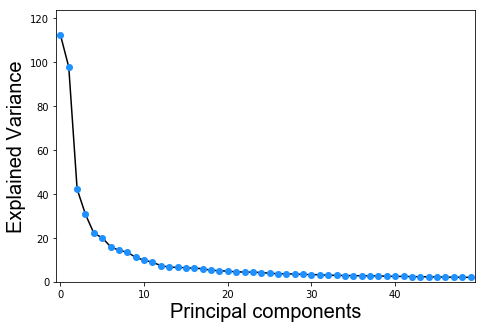

In [287]:
draw_pca_explained_var(pdX)

In [288]:
dim = 50
pca = PCA(n_components=dim)
pca.fit(pdX.T)
pcs = pca.transform(pdX.T)[:,0:20]

### Selection of training cells

In [289]:
Counter(Xs_test.obs['cl_tumor_pca'])

Counter({'Mesenchymal cells': 8396,
         'Basal cells': 4969,
         'Luminal cells': 3894,
         'Other': 1154,
         'nan': 86175})

In [290]:
cells_train_lum = list(np.random.choice(Xs_test.obs[Xs_test.obs['cl_tumor_pca']=='Luminal cells'].index, 2000, replace=False))
cells_train_bas = list(np.random.choice(Xs_test.obs[Xs_test.obs['cl_tumor_pca']=='Basal cells'].index, 2000, replace=False))
cells_train_mes = list(np.random.choice(Xs_test.obs[Xs_test.obs['cl_tumor_pca']=='Mesenchymal cells'].index, 2000, replace=False))
cells_train = (cells_train_lum + cells_train_bas + cells_train_mes)

In [291]:
Xs_test.obs['train_pca'] = 0
Xs_test.obs['train_pca'].loc[cells_train] = 1

/Users/simjoo/.local/lib/python3.6/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


In [292]:
Counter(Xs_test.obs['train_pca'])

Counter({0: 98588, 1: 6000})

In [293]:
ixs_train_lum = [x in cells_train_lum for x in Xs_test.obs_names]
ixs_train_bas = [x in cells_train_bas for x in Xs_test.obs_names]
ixs_train_mes = [x in cells_train_mes for x in Xs_test.obs_names]

In [294]:
pcs_train = [pcs[i] for i in [ixs_train_lum, ixs_train_bas, ixs_train_mes]]
pcs_test = np.array(pcs)

In [295]:
c, p = pg.classify(pcs_train, 
                   pcs_test, 
                   k=50,
                   metric="euclidean") 

Finding 50 nearest neighbors using minkowski metric and 'auto' algorithm


In [296]:
Xs_test.obs['pheno_class_pca'] = c
Xs_test.obs['pheno_prob0_pca'] = p[:,0]
Xs_test.obs['pheno_prob1_pca'] = p[:,1]
Xs_test.obs['pheno_prob2_pca'] = p[:,2]

## Training cells - PCA

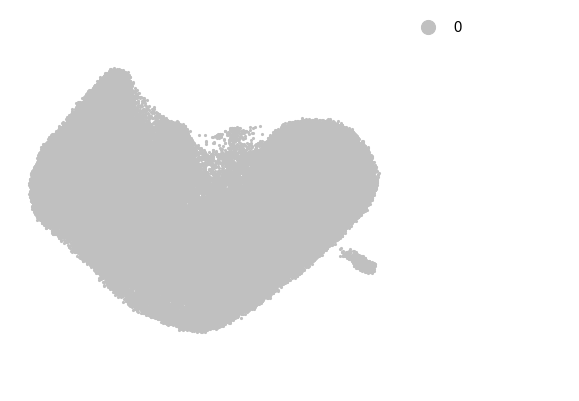

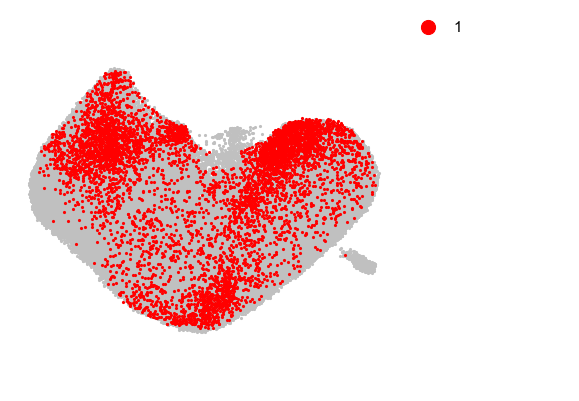

In [297]:
draw_scatter_groups_individual(Xs_fit_on_aut.obsm['X_umap_pca'], 
                               Xs_test.obs['train_pca'],
                               cmap={0:'silver',1:'red'},
                               s=10, show_axes=False)

## Probabilities - test data - PCA

In [298]:
c_sel = Xs_test.obs[Xs_test.obs['train_pca']!=1].index

In [299]:
len(c_sel)

98588

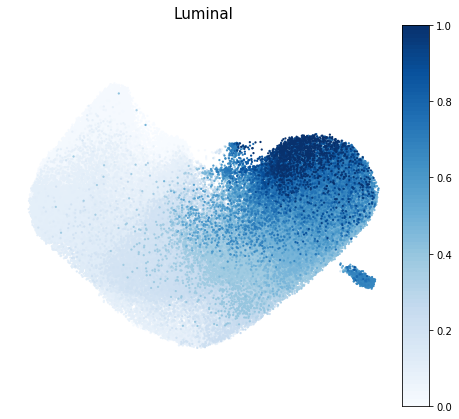

In [300]:
draw_scatter_expr(Xs_fit_on_aut[c_sel].obsm['X_umap_pca'],
                  Xs_test[c_sel].obs['pheno_prob0_pca'],
                  0,
                  1,
                  text = 'Luminal',
                  cmap=plt.cm.Blues,
                  s = 5, show_axes=False)

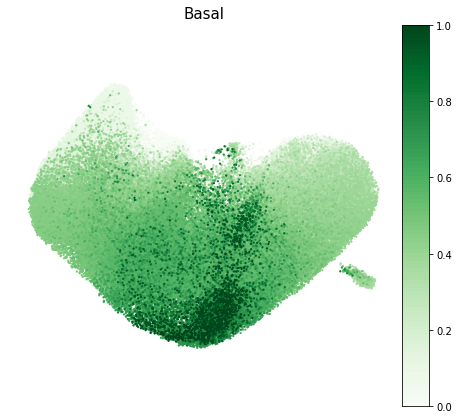

In [301]:
draw_scatter_expr(Xs_fit_on_aut[c_sel].obsm['X_umap_pca'],
                  Xs_test[c_sel].obs['pheno_prob1_pca'],
                  0,
                  1,
                  text = 'Basal',
                  cmap=plt.cm.Greens,
                  s = 5, show_axes=False)

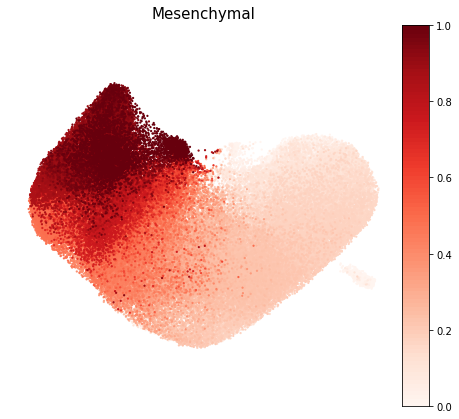

In [302]:
draw_scatter_expr(Xs_fit_on_aut[c_sel].obsm['X_umap_pca'],
                  Xs_test[c_sel].obs['pheno_prob2_pca'],
                  0,
                  1,
                  text = 'Mesenchymal',
                  cmap=plt.cm.Reds,
                  s = 5, show_axes=False)

## Classes - PCA

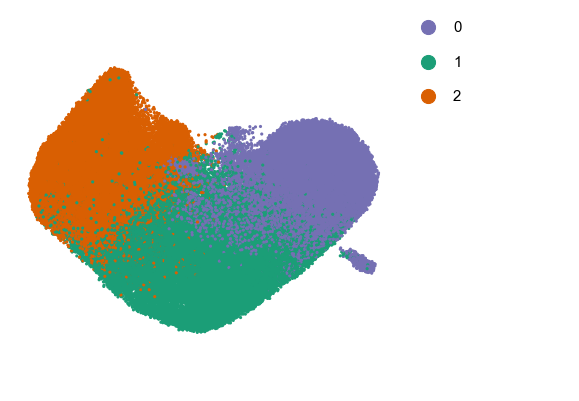

In [303]:
draw_scatter_groups(Xs_fit_on_aut[c_sel].obsm['X_umap_pca'], 
                    Xs_test[c_sel].obs['pheno_class_pca'],
                    cmap={0:'#7570b3',1:'#1b9e77',2:'#d95f02',None:'silver'},
                    s=10, show_axes=False)

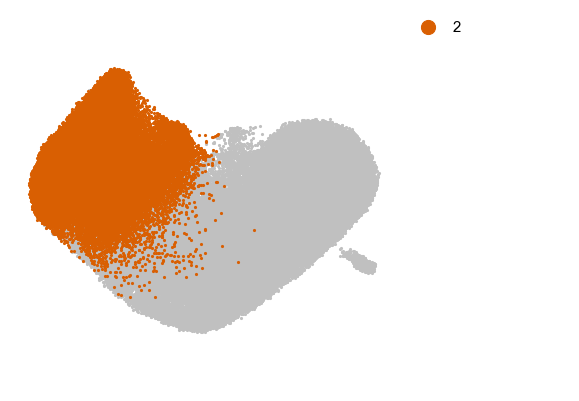

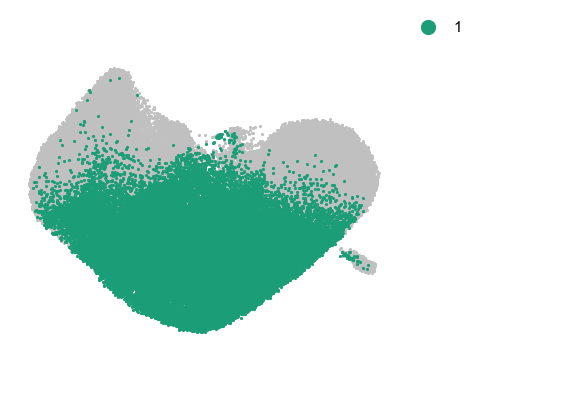

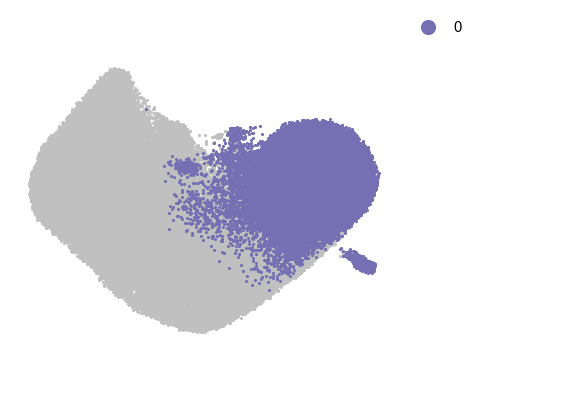

In [304]:
draw_scatter_groups_individual(Xs_fit_on_aut[c_sel].obsm['X_umap_pca'], 
                    Xs_test[c_sel].obs['pheno_class_pca'],
                    cmap={0:'#7570b3',1:'#1b9e77',2:'#d95f02',None:'silver'},
                    s=10, show_axes=False)

## Ternary plot - PCA

In [305]:
import ternary

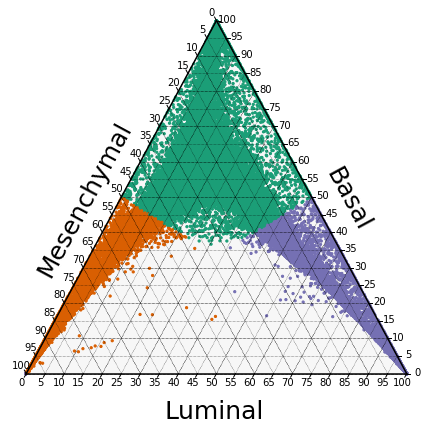

In [306]:
dat = list(zip(Xs_test[c_sel].obs['pheno_prob0_pca']*100, 
               Xs_test[c_sel].obs['pheno_prob1_pca']*100,
               Xs_test[c_sel].obs['pheno_prob2_pca']*100))
cmap = {0:'#7570b3',1:'#1b9e77',2:'#d95f02',None:'silver'}
clist = [cmap[i] for i in Xs_test[c_sel].obs['pheno_class_pca']]

## Boundary and Gridlines
scale = 100
figure, tax = ternary.figure(scale=scale)
figure.set_figheight(7.5)
figure.set_figwidth(7.5)

# Draw Boundary and Gridlines
tax.boundary(linewidth=1.5)
tax.gridlines(color="black", multiple=10)
tax.gridlines(color="black", multiple=5, linewidth=0.5)

# Set Axis labels and Title
fontsize = 25
offset = 0.1
tax.left_axis_label("Mesenchymal", fontsize=fontsize, offset=offset)
tax.right_axis_label("Basal", fontsize=fontsize, offset=offset)
tax.bottom_axis_label("Luminal", fontsize=fontsize, offset=0.025)

# Set ticks
tax.ticks(axis='lbr', linewidth=1, multiple=5, offset=0.01)

# Background color
tax.set_background_color(color="whitesmoke", alpha=0.7) # the detault, essentially

# Remove default Matplotlib Axes
tax.clear_matplotlib_ticks()
tax.get_axes().axis('off')

#plot scatter

tax.scatter(dat, s=5, color = clist)

# Modeling of pseudotime data - autochthonous

In [343]:
Xs = sc.read_h5ad('%s/%s_Xs_PDAC_Lgr5_tumor_aut.h5' % (path_output, exp_id))

## Plot data - PCA

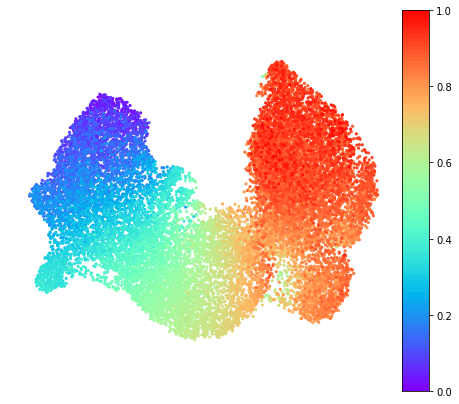

In [344]:
draw_scatter_expr(Xs.obsm['X_umap_pca'], 
                  Xs.obs['dpt_pseudotime_pca'],
                  cmap=plt.cm.rainbow,
                  vmin=0,
                  vmax=1,
                  s=10, show_axes=False)

## Model expression along pseudotime

In [383]:
X = sc.read_h5ad('%s/%s_X_PDAC_Lgr5_pp.h5' % (path_output, exp_id))[Xs.obs_names]

In [384]:
X.obs['dpt_pseudotime_pca'] = Xs.obs['dpt_pseudotime_pca']

Trying to set attribute `.obs` of view, copying.


### Feature selection

In [385]:
g_sel = X.var[(X.var['mean_counts']>0.1) & (X.var['n_cells_by_counts']>(len(X.obs_names)*0.1))].index

In [386]:
len(g_sel)

8042

In [387]:
X = X[:,g_sel]

### Model expression - PCA space

In [388]:
def fit_vgam(adata, genes, var_pt, var_sf='size_factor', layer='raw', neg_log = False, steps=101, df=3):
    
    assert var_pt in adata.obs.columns, 'var_pt not in adata.obs'
    assert var_sf in adata.obs.columns, 'var_sf not in adata.obs'

    from rpy2 import robjects
    from rpy2.robjects import FloatVector
    from rpy2.robjects.packages import importr

    rbase = importr('base')
    rvgam = importr('VGAM', robject_translations = {"nvar.vlm": "nvar__vlm"})
    rstats = importr('stats')
    robjects.r['options'](warn=-1)
    
    fit = pd.DataFrame(index=genes, columns=np.linspace(0, np.max(adata.obs[var_pt]).astype(str), steps))
    stats = pd.DataFrame(index = genes, columns=['Chisq','Pr(>Chisq)'])
    
    pt = robjects.FloatVector(adata.obs[var_pt])
    sf = robjects.FloatVector(adata.obs[var_sf])
    X_pred = robjects.FloatVector(np.linspace(0, np.max(adata.obs[var_pt]), steps))
    
    
    for g in genes:
        try:
            Y = robjects.FloatVector(np.rint(np.array(adata[:,g].layers[layer].todense()).flatten()))

            DF = robjects.DataFrame({'Y':Y, 'X':pt, 'sf':sf})

            fmla_red = robjects.Formula("Y ~ 1")
            fit_red = rvgam.vglm(fmla_red, rvgam.negbinomial, data = DF, 
                                 na_action = robjects.r['na.fail'], smart = True)

            fmla_full = robjects.Formula("Y ~ sm.ns(X, df = %s)" % df)                         
            fit_full = rvgam.vglm(fmla_full, rvgam.negbinomial, data = DF, 
                                 na_action = robjects.r['na.fail'], smart = True)

            DF_pred = robjects.DataFrame({'X':X_pred})
            predicted = rvgam.predict(fit_full, newdata = DF_pred, type = 'response')
            fit.loc[g] = list(predicted.flatten())

            lr_stats_red = rvgam.lrtest(fit_full, fit_red)
            stats.loc[g]['Chisq','Pr(>Chisq)'] = [lr_stats_red.do_slot('Body').loc['2']['Chisq'],
                                                  lr_stats_red.do_slot('Body').loc['2']['Pr(>Chisq)']]
        except:
            continue
        
        
    stats['Pr(>Chisq)'] = rstats.p_adjust(FloatVector(stats['Pr(>Chisq)']), method = 'BH')
        
    if neg_log:
        stats['Pr(>Chisq)'] = -np.log10(stats['Pr(>Chisq)'].astype(float))
    
    return fit, stats

In [389]:
c_sel = Xs.obs[Xs.obs['cl_tumor_pca']!='Other'].index
c_sel = np.random.choice(c_sel, 5000, replace=False)

In [390]:
fit_pca, stats_pca = fit_vgam(X[c_sel],
                              g_sel, 
                              'dpt_pseudotime_pca', 
                              layer = 'norm_log2',
                              neg_log = False, df=3)

R[write to console]: Error in vglm.fitter(x = x, y = y, w = w, offset = offset, Xm2 = Xm2,  : 
  could not obtain valid initial values. Try using 'etastart', 'coefstart' or 'mustart', else family-specific arguments such as 'imethod'.
Calls: <Anonymous> -> vglm.fitter

R[write to console]: Error in vglm.fitter(x = x, y = y, w = w, offset = offset, Xm2 = Xm2,  : 
  could not obtain valid initial values. Try using 'etastart', 'coefstart' or 'mustart', else family-specific arguments such as 'imethod'.
Calls: <Anonymous> -> vglm.fitter

R[write to console]: Error in vglm.fitter(x = x, y = y, w = w, offset = offset, Xm2 = Xm2,  : 
  could not obtain valid initial values. Try using 'etastart', 'coefstart' or 'mustart', else family-specific arguments such as 'imethod'.
Calls: <Anonymous> -> vglm.fitter



In [395]:
Xs.uns['dpt_vgam_fit_pca'] = fit_pca
Xs.uns['dpt_vgam_stats_pca'] = stats_pca

## Checkpoint

In [409]:
#Xs.write_h5ad('%s/%s_Xs_PDAC_Lgr5_tumor_aut.h5' % (path_output, exp_id))

## Clustering of pseudotime-dependent genes - PCA

In [112]:
Xs = sc.read_h5ad('%s/%s_Xs_PDAC_Lgr5_tumor_aut.h5' % (path_output, exp_id))

## Select pseudotime-dependent genes

In [113]:
stats_pca = Xs.uns['dpt_vgam_stats_pca']
fit_pca = Xs.uns['dpt_vgam_fit_pca']

In [114]:
thr = 1e-10

In [115]:
g_sel = stats_pca[stats_pca['Pr(>Chisq)']<thr].index

In [116]:
len(g_sel)

3969

In [117]:
fit_pca_sel = fit_pca.loc[g_sel].astype(float)

## Leiden clustering of pseudotime-dependent genes (for convenience, use scanpy functions on transposed matrix)

In [222]:
fit_pca_scaled = fit_pca_sel.apply(lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)), axis=1)

In [223]:
scfit_pca = pd2sc(fit_pca_scaled.T)

In [230]:
sc.pp.neighbors(scfit_pca, n_neighbors=50, use_rep='X', metric='euclidean')

In [231]:
sc.tl.umap(scfit_pca, min_dist=1, spread=3)

In [232]:
sc.tl.leiden(scfit_pca, resolution = 0.1)

In [233]:
len(set(scfit_pca.obs['leiden']))

4

In [236]:
scfit_pca_leiden = groups_reorder(scfit_pca.obs['leiden'], ['0','1','2','3'])

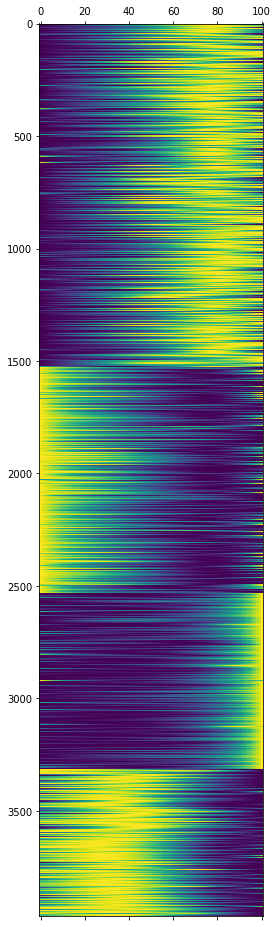

In [270]:
plt.matshow(fit_pca_scaled.loc[scfit_pca_leiden.index], aspect='auto')

## Gene set enrichment

## #0

In [271]:
genes0 = scfit_pca.obs['leiden'][scfit_pca.obs['leiden']=='0'].index

In [272]:
len(genes0)

1531

In [300]:
enr_genes0 = gp.enrichr(gene_list=list(genes0),
                        gene_sets='Reactome_2016',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

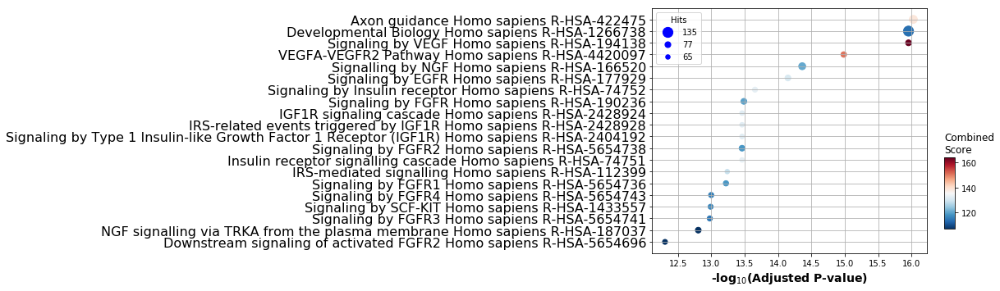

In [301]:
gp.plot.dotplot(enr_genes0.res2d, top_term=20)

## #1

In [260]:
genes1 = scfit_pca.obs['leiden'][scfit_pca.obs['leiden']=='1'].index

In [261]:
len(genes1)

1003

In [308]:
enr_genes1 = gp.enrichr(gene_list=list(genes1),
                        gene_sets='KEGG_2016',
                        organism='Mouse',
                        cutoff=0.001,
                        no_plot=True,)

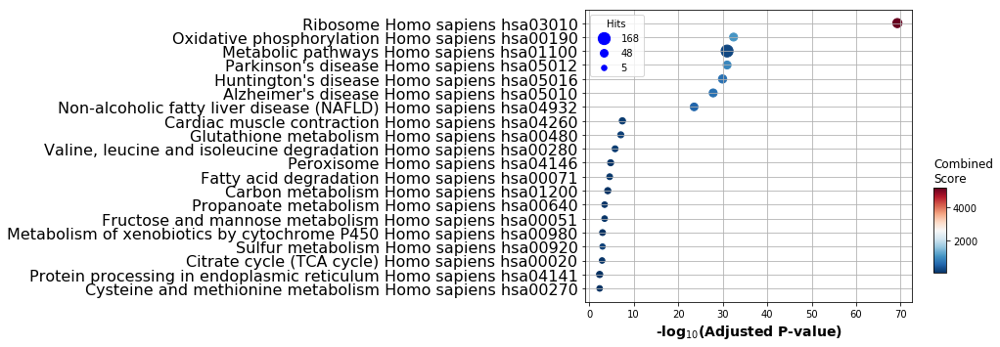

In [309]:
gp.plot.dotplot(enr_genes1.res2d, top_term=20)

## #2

In [247]:
genes2 = scfit_pca.obs['leiden'][scfit_pca.obs['leiden']=='2'].index

In [248]:
len(genes2)

781

In [304]:
enr_genes2 = gp.enrichr(gene_list=list(genes2),
                        gene_sets='Reactome_2016',
                        organism='Mouse',
                        cutoff=0.001,
                        no_plot=True,)

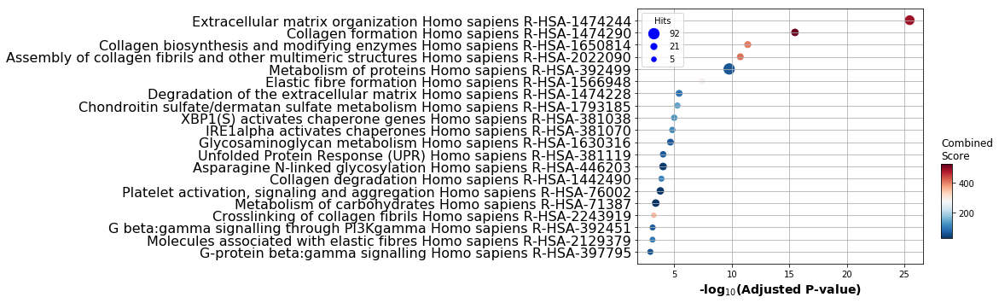

In [305]:
gp.plot.dotplot(enr_genes2.res2d, top_term=20)

## #3

In [266]:
genes3 = scfit_pca.obs['leiden'][scfit_pca.obs['leiden']=='3'].index

In [267]:
len(genes3)

654

In [306]:
enr_genes3 = gp.enrichr(gene_list=list(genes3),
                        gene_sets='Reactome_2016',
                        organism='Mouse',
                        cutoff=0.001,
                        no_plot=True,)

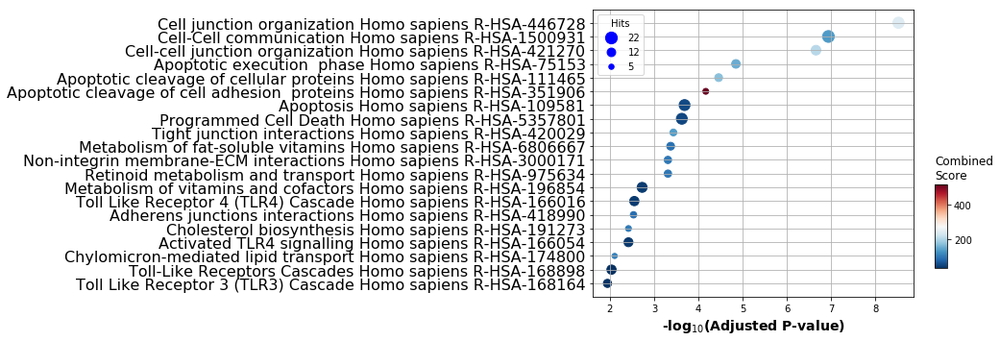

In [307]:
gp.plot.dotplot(enr_genes3.res2d, top_term=20)

### Checkpoint

In [277]:
Xs.uns['dpt_vgam_clusters_pca'] = pd.DataFrame(scfit_pca.obs['leiden'])

In [278]:
#Xs.write_h5ad('%s/%s_Xs_PDAC_Lgr5_tumor_aut.h5' % (path_output, exp_id))

## Distribution over samples

In [416]:
def draw_violin_pseudotime(adata, dpt_var, group_var, cmap=plt.cm.tab20, gr_order=None, scatter=False, bw='scott'):
    
    assert dpt_var in adata.obs.columns, 'dpt_var not in adata'
    dpt = adata.obs[dpt_var]
    
    assert group_var in adata.obs.columns, 'group_var not in adata'
    groups = adata.obs[group_var]
    
    if not gr_order:
        gr_order = return_unique(groups)
        
    L = len(set(gr_order))
    
    #initialize figure

    height = 1 * L
    width = 10

    plt.figure(facecolor = 'w', figsize = (width, height))
    
    #define colormap
    
    if type(cmap) != dict:
        cm = cmap
        cmap = {}
        for ix, gr in enumerate(return_unique(groups)):
            cmap[gr] = cm(float(ix) / 20)
            
    clist = [cmap[groups[c]] for c in groups.index]
    
    #define x and y axes

    ax = plt.subplot()
    
    ax.set_xlim(0,1)
    ax.set_xticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
    ax.set_xticklabels([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0], family = 'Arial', fontsize = 20, rotation = 'vertical')
    ax.set_xlabel('Pseudotime', family = 'Arial', fontsize = 30)
    
    ax.set_ylim(L-0.5,-0.5)
    ax.set_yticks(range(0,L))
    ax.set_yticklabels(gr_order, family = 'Arial', fontsize = 20)

    
    #plot data

    for p, i in enumerate(gr_order):

        i_tmp = groups[groups==i].index
        d_tmp = dpt[i_tmp].values
        
        if scatter:
            ax.scatter(d_tmp,
                       [p-(i-0.5)/2 for i in np.random.rand(len(d_tmp), 1)],
                        color = 'k',
                        s = 1,
                        alpha = 0.25,
                        zorder = 1)

        violin = ax.violinplot([d_tmp],
                                positions = [p],
                                vert=False,
                                showextrema=False,
                                widths=0.95, 
                               bw_method=bw)

        for v in violin['bodies']:
            v.set_facecolor(cmap[i])
            v.set_linewidth(0)
            v.set_alpha(0.75)
            v.set_zorder(0)

        ax.axhline(p, color='k', linewidth=2)

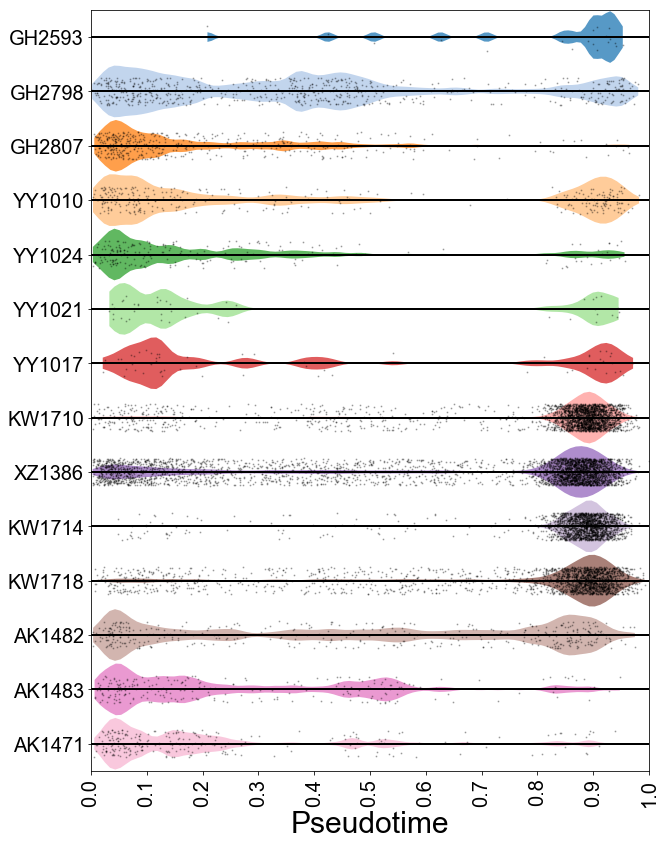

In [362]:
draw_violin_pseudotime(Xs, 'dpt_pseudotime_pca', 'mouse', cmap=plt.cm.tab20, gr_order=None, bw=0.05, scatter=True)

## Gene expression

In [280]:
def draw_expression_pseudotime(df, fit, gene, pt, groups, label=None, cmap=plt.cm.tab20):
    
    from statsmodels.nonparametric.smoothers_lowess import lowess
    
    dat = df.loc[gene]
    dat_fit = fit.loc[gene]
    
    if not label:
        label=gene
    
    #define cmap
    
    if type(cmap) != dict:
        cm = cmap
        cmap = {}
        for ix, gr in enumerate(return_unique(groups)):
            cmap[gr] = cm(float(ix) / 20)
            
    clist = [cmap[groups[c]] for c in groups.index]
    
    #initialize figure

    height = 5
    width = 7.5

    plt.figure(facecolor = 'w', figsize = (width, height))
    
    ax = plt.subplot(111)
    
    #define axes
    
    ax.set_xlim(0,1)
    ax.set_xticks([])
    ax.set_xlabel('Pseudotime', family = 'Arial', fontsize = 25)
    
    ax.set_ylabel(gene, family = 'Arial', fontsize = 25)
    
    #plot scatter
    
    ax.scatter(pt, dat, s=10, color=clist)
    
    #plot fit
    
    ax.plot(np.array(dat_fit.index).astype(float), dat_fit, color='k', lw=5)

In [443]:
pdX = sc2pd(Xs, 'norm_log2')

In [544]:
def fit_vgam(adata, genes, var_pt, var_sf='size_factor', layer='raw', neg_log = False, steps=101, df=3):
    
    assert var_pt in adata.obs.columns, 'var_pt not in adata.obs'
    assert var_sf in adata.obs.columns, 'var_sf not in adata.obs'

    from rpy2 import robjects
    from rpy2.robjects import FloatVector
    from rpy2.robjects.packages import importr

    rbase = importr('base')
    rvgam = importr('VGAM', robject_translations = {"nvar.vlm": "nvar__vlm"})
    rstats = importr('stats')
    robjects.r['options'](warn=-1)
    
    fit = pd.DataFrame(index=genes, columns=np.linspace(0, np.max(adata.obs[var_pt]), steps))
    stats = pd.DataFrame(index = genes, columns=['Chisq','Pr(>Chisq)'])
    
    pt = robjects.FloatVector(adata.obs[var_pt])
    sf = robjects.FloatVector(adata.obs[var_sf])
    X_pred = robjects.FloatVector(np.linspace(0, np.max(adata.obs[var_pt]), steps))
    
    
    for g in genes:
        Y = robjects.FloatVector(np.rint(np.array(adata[:,g].layers[layer].todense()).flatten()))
        
        DF = robjects.DataFrame({'Y':Y, 'X':pt, 'sf':sf})
                
        fmla_red = robjects.Formula("Y ~ 1")
        fit_red = rvgam.vglm(fmla_red, rvgam.negbinomial, data = DF, 
                             na_action = robjects.r['na.fail'], smart = True)

        fmla_full = robjects.Formula("Y ~ sm.ns(X, df = %s)" % df)                         
        fit_full = rvgam.vglm(fmla_full, rvgam.negbinomial, data = DF, 
                             na_action = robjects.r['na.fail'], smart = True)
        
        DF_pred = robjects.DataFrame({'X':X_pred})
        predicted = rvgam.predict(fit_full, newdata = DF_pred, type = 'response')
        fit.loc[g] = list(predicted.flatten())

        lr_stats_red = rvgam.lrtest(fit_full, fit_red)
        stats.loc[g]['Chisq','Pr(>Chisq)'] = [lr_stats_red.do_slot('Body').loc['2']['Chisq'],
                                              lr_stats_red.do_slot('Body').loc['2']['Pr(>Chisq)']]
        
        
    stats['Pr(>Chisq)'] = rstats.p_adjust(FloatVector(stats['Pr(>Chisq)']), method = 'BH')
        
    if neg_log:
        stats['Pr(>Chisq)'] = -np.log10(stats['Pr(>Chisq)'].astype(float))
    
    return fit, stats

In [565]:
fit_pca, stats_pca = fit_vgam(Xs,
                              ['Epcam','Lgals4','Vim','Cldn6'], 
                              'dpt_pseudotime_pca', 
                              layer = 'norm_log2',
                              neg_log = False, df=4)

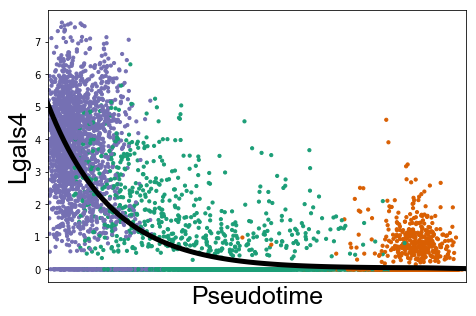

In [566]:
draw_expression_pseudotime(pdX,
                           fit_pca,
                           'Lgals4',
                           Xs.obs['dpt_pseudotime_pca'], 
                           Xs.obs['cl_tumor_pca'], 
                           cmap=cmap_cl_tumor)

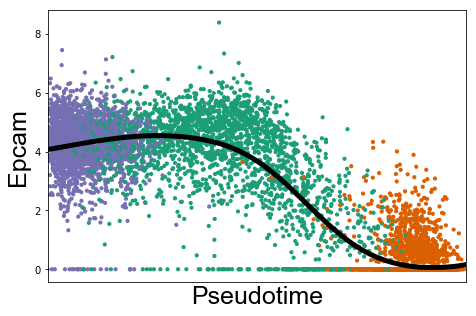

In [567]:
draw_expression_pseudotime(pdX,
                           fit_pca,
                           'Epcam',
                           Xs.obs['dpt_pseudotime_pca'], 
                           Xs.obs['cl_tumor_pca'], 
                           cmap=cmap_cl_tumor)

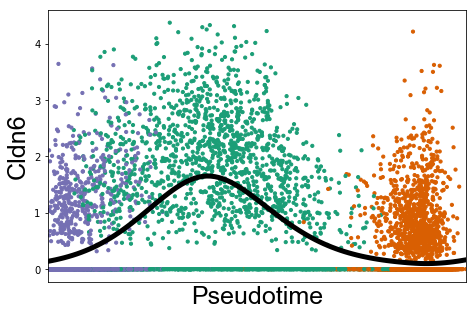

In [568]:
draw_expression_pseudotime(pdX,
                           fit_pca,
                           'Cldn6',
                           Xs.obs['dpt_pseudotime_pca'], 
                           Xs.obs['cl_tumor_pca'], 
                           cmap=cmap_cl_tumor)

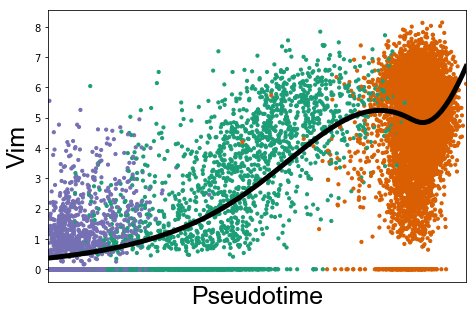

In [569]:
draw_expression_pseudotime(pdX,
                           fit_pca,
                           'Vim',
                           Xs.obs['dpt_pseudotime_pca'], 
                           Xs.obs['cl_tumor_pca'], 
                           cmap=cmap_cl_tumor)